#Telecom Customer Churn Prediction Model

**Project Background** : The Telecommunications companies faces challenges with customer churn rates higher the 10% annually.**To address this issue, the project aims to develop a classification model to predict customer churn based on individual features.**The goal is to leverage this data to create a predictive model that can help the company identify customers at risk of churning and implement retention strategies effectively.

The data set includes the following variables:
* state: Categorical, for the 51 states and the District of Columbia.
* Area.code
* account.length: how long the account has been active.
* voice.plan: yes or no, voicemail plan.
* voice.messages: number of voicemail messages.
* intl.plan: yes or no, international plan.
* intl.mins: minutes customer used service to make international calls.
* intl.calls: total number of international calls.
* intl.charge: total international charge.
* day.mins: minutes customer used service during the day.
* day.calls: total number of calls during the day.
* day.charge: total charge during the day.
* eve.mins: minutes customer used service during the evening.
* eve.calls: total number of calls during the evening.
* eve.charge: total charge during the evening.
* night.mins: minutes customer used service during the night.
* night.calls: total number of calls during the night.
* night.charge: total charge during the night.
* customer.calls: number of calls to customer service.
* churn(**Target**): Categorical, yes or no. Indicator of whether the customer has left the company (yes or no).


####Import the libraries

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# 1.Load the dataset

####Load the Raw-data    -> Data integration

In [38]:
df = pd.read_csv("/content/drive/MyDrive/DS_P383/Churn (1).csv")

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      5000 non-null   object 
 13  eve.mins        5000 non-null   object 
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls     5000 non-null   i

#### DATA REDUCTION : The "Unnamed: 0" had been removed as it is irrelevant Beacuse *** It does not have the predictive power and for predicting the churn ***

In [40]:
df =df.drop(['Unnamed: 0'],axis =1 )

* The  [day.charge ,eve.mins] columns are numerical values but are in object dtypes.So, we are changing them to { float } dtype  values(NUMERICAL VARIABLES).



#### All Data TYpres are mentioned correctly.

In [41]:
column_dict = {"day.charge":float ,"eve.mins" :float}
df=df.astype(column_dict)                         # pd.astype("dict")          ->  returns the new df with changed dtypes

In [42]:
df.select_dtypes(include='object')                        # Categorical variables

,state,area.code,voice.plan,intl.plan,churn
0,KS,area_code_415,yes,no,no
1,OH,area_code_415,yes,no,no
2,NJ,area_code_415,no,no,no
3,OH,area_code_408,no,yes,no
4,OK,area_code_415,no,yes,no
...,...,...,...,...,...
4995,HI,area_code_408,yes,no,no
4996,WV,area_code_415,no,no,yes
4997,DC,area_code_415,no,no,no
4998,DC,area_code_510,no,no,no


* churn (yes || no) is the target output.

In [43]:
df.select_dtypes(include=['int64','float64'])             #Numerical variables

,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
0,128,25,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1
1,107,26,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1
2,137,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0
3,84,0,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2
4,75,0,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,50,40,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2
4996,152,0,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3
4997,61,0,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1
4998,109,0,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0


# 2.Data Exploration

####Descriptive Statistics

In [44]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
account.length,5000.0,100.258600,39.694560,1.0,73.000,100.00,127.00,243.00
voice.messages,5000.0,7.755200,13.546393,0.0,0.000,0.00,17.00,52.00
intl.mins,5000.0,10.261780,2.761396,0.0,8.500,10.30,12.00,20.00
intl.calls,5000.0,4.435200,2.456788,0.0,3.000,4.00,6.00,20.00
intl.charge,5000.0,2.771196,0.745514,0.0,2.300,2.78,3.24,5.40
day.mins,5000.0,180.288900,53.894699,0.0,143.700,180.10,216.20,351.50
day.calls,5000.0,100.029400,19.831197,0.0,87.000,100.00,113.00,165.00
day.charge,4993.0,30.653501,9.166356,0.0,24.430,30.62,36.75,59.76
eve.mins,4976.0,200.580326,50.554637,0.0,166.275,201.00,234.10,363.70
eve.calls,5000.0,100.191000,19.826496,0.0,87.000,100.00,114.00,170.00


In [45]:
df.describe(include ="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
state,5000,51,WV,158,NaN,NaN,NaN,NaN,NaN,NaN,NaN
area.code,5000,3,area_code_415,2495,NaN,NaN,NaN,NaN,NaN,NaN,NaN
account.length,5000.0,NaN,NaN,NaN,100.2586,39.69456,1.0,73.0,100.0,127.0,243.0
voice.plan,5000,2,no,3677,NaN,NaN,NaN,NaN,NaN,NaN,NaN
voice.messages,5000.0,NaN,NaN,NaN,7.7552,13.546393,0.0,0.0,0.0,17.0,52.0
intl.plan,5000,2,no,4527,NaN,NaN,NaN,NaN,NaN,NaN,NaN
intl.mins,5000.0,NaN,NaN,NaN,10.26178,2.761396,0.0,8.5,10.3,12.0,20.0
intl.calls,5000.0,NaN,NaN,NaN,4.4352,2.456788,0.0,3.0,4.0,6.0,20.0
intl.charge,5000.0,NaN,NaN,NaN,2.771196,0.745514,0.0,2.3,2.78,3.24,5.4
day.mins,5000.0,NaN,NaN,NaN,180.2889,53.894699,0.0,143.7,180.1,216.2,351.5


* State has 51 unique values while area_code has 3 unique values . What is the relation ?
* Units for account length ?

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state           5000 non-null   object 
 1   area.code       5000 non-null   object 
 2   account.length  5000 non-null   int64  
 3   voice.plan      5000 non-null   object 
 4   voice.messages  5000 non-null   int64  
 5   intl.plan       5000 non-null   object 
 6   intl.mins       5000 non-null   float64
 7   intl.calls      5000 non-null   int64  
 8   intl.charge     5000 non-null   float64
 9   day.mins        5000 non-null   float64
 10  day.calls       5000 non-null   int64  
 11  day.charge      4993 non-null   float64
 12  eve.mins        4976 non-null   float64
 13  eve.calls       5000 non-null   int64  
 14  eve.charge      5000 non-null   float64
 15  night.mins      5000 non-null   float64
 16  night.calls     5000 non-null   int64  
 17  night.charge    5000 non-null   f

* All the columns data types are correctly identified

#### In Data Analysis we will analyze to find out the below stuff
+ Missing values
+ All the Numerical Variables
+ Distribution of the Numerical Variables
+ Categorical Variables
+ Cardinality of Categorical Variables
+ Outliers
+ Relationshop between independent and dependent feature (Target)

In [47]:
# print shape of dataset with rows and columns
print(df.shape)
# print top 5 records
df.head()

(5000, 20)


,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,no
4,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


####2.1 Missing values

In [48]:
df.isnull().sum()

state              0
area.code          0
account.length     0
voice.plan         0
voice.messages     0
intl.plan          0
intl.mins          0
intl.calls         0
intl.charge        0
day.mins           0
day.calls          0
day.charge         7
eve.mins          24
eve.calls          0
eve.charge         0
night.mins         0
night.calls        0
night.charge       0
customer.calls     0
churn              0
dtype: int64

[ Day.charge , eve.calls ] has missing values.

In [49]:
(df.isnull().sum()/len(df))*100

state             0.00
area.code         0.00
account.length    0.00
voice.plan        0.00
voice.messages    0.00
intl.plan         0.00
intl.mins         0.00
intl.calls        0.00
intl.charge       0.00
day.mins          0.00
day.calls         0.00
day.charge        0.14
eve.mins          0.48
eve.calls         0.00
eve.charge        0.00
night.mins        0.00
night.calls       0.00
night.charge      0.00
customer.calls    0.00
churn             0.00
dtype: float64

#### The percentage of missing values in the data is less than 0.5 % of the entire data .

In [50]:
df.sort_values(by ='day.charge',na_position='first').head(10)

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
12,IA,area_code_408,168,no,0,no,11.2,2,3.02,128.8,96,NaN,104.9,71,8.92,141.1,128,6.35,1,no
27,MT,area_code_408,54,no,0,no,14.7,4,3.97,134.3,73,NaN,155.5,100,13.22,102.1,68,4.59,3,no
47,DE,area_code_408,142,no,0,no,7.4,5,2.00,187.0,133,NaN,134.6,74,11.44,242.2,127,10.90,2,no
4407,TN,area_code_415,125,no,0,no,7.7,3,2.08,138.5,96,NaN,159.7,117,13.57,212.7,91,9.57,2,no
4755,OK,area_code_408,17,no,0,no,14.8,5,4.00,180.4,121,NaN,228.5,111,19.42,199.5,99,8.98,0,no
4965,NC,area_code_408,92,no,0,no,10.7,2,2.89,192.1,87,NaN,193.0,122,16.41,133.4,79,6.00,1,no
4992,MT,area_code_415,83,no,0,no,10.3,6,2.78,188.3,70,NaN,243.8,88,20.72,213.7,79,9.62,0,no
1397,VT,area_code_510,101,no,0,no,7.2,4,1.94,0.0,0,0.00,192.1,119,16.33,168.8,95,7.60,1,no
1345,SD,area_code_415,98,no,0,no,6.8,1,1.84,0.0,0,0.00,159.6,130,13.57,167.1,88,7.52,4,yes
2736,OK,area_code_510,127,yes,27,no,9.2,5,2.48,2.6,113,0.44,254.0,102,21.59,242.7,156,10.92,3,no


* There are 3 different types of Missing data that can be encountered.
1. MCAR ( Missing Completley At Random ) : The missing data is completly at random and is distributed randomly accross the data range ,not limiting to one specific range and is feature which has missing values not related/can be dependent to another feature .
2. MAR (Missing At Random ) : The missing data is observed randomly on the data and feature which has the dependency to another feature in the data.
3. MNAR (Missing Not At Random ) : The missing data is here , caused by a relationship between missing values of the data and observed values in the data itself.

* The feature day.charge has NULL values and the values are dependent on features day.mins and day.charge .So, it is MAR (Missing at Random )  

In [51]:
df.sort_values(by ='eve.mins',na_position='first')

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
89,NJ,area_code_415,128,no,0,no,13.9,4,3.75,237.9,125,40.44,NaN,93,21.05,208.9,68,9.40,1,yes
102,VT,area_code_415,135,no,0,no,10.5,6,2.84,151.7,82,25.79,NaN,105,10.12,180.0,100,8.10,0,no
110,MI,area_code_408,120,no,0,no,8.3,8,2.24,165.0,100,28.05,NaN,83,26.96,119.2,86,5.36,1,no
159,FL,area_code_510,115,yes,24,no,9.6,4,2.59,142.1,124,24.16,NaN,129,15.59,164.8,114,7.42,1,no
231,OH,area_code_415,63,yes,36,yes,11.0,6,2.97,199.0,110,33.83,NaN,111,24.76,197.6,92,8.89,1,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4564,TX,area_code_510,145,no,0,no,6.2,6,1.67,158.8,120,27.00,352.1,145,29.93,177.6,140,7.99,2,no
2551,MD,area_code_415,102,no,0,no,10.9,3,2.94,129.5,56,22.02,354.2,118,30.11,145.5,93,6.55,1,no
4892,IN,area_code_510,63,no,0,no,5.6,3,1.51,6.6,107,1.12,359.3,142,30.54,252.5,131,11.36,0,no
2331,IN,area_code_415,46,yes,34,no,7.2,2,1.94,191.4,102,32.54,361.8,96,30.75,147.5,132,6.64,1,no



* The feature eve.mins has NULL values and the values are dependent on features eve.calls and eve.charge .So, it is MAR (Missing at Random )  

In [52]:
df=df.dropna()

In [53]:
df.isnull().sum()

state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

* The null values have been dropped .

#### 2.2 Duplicated values

In [54]:
df[df.duplicated()]

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn


* There are no duplicates in the data frame.

In [55]:
df.columns

Index(['state', 'area.code', 'account.length', 'voice.plan', 'voice.messages',
       'intl.plan', 'intl.mins', 'intl.calls', 'intl.charge', 'day.mins',
       'day.calls', 'day.charge', 'eve.mins', 'eve.calls', 'eve.charge',
       'night.mins', 'night.calls', 'night.charge', 'customer.calls', 'churn'],
      dtype='object')

* Feature Engineering prospects :
** day.charge, day.min ,day.calls --->"day charge per min" and "day charge per call"
* Simlarly , for the Eveing , Night ,International categories

In [56]:
num_cols = df.select_dtypes(include = np.number).columns
num_cols                                                # Numerical feature columns

Index(['account.length', 'voice.messages', 'intl.mins', 'intl.calls',
       'intl.charge', 'day.mins', 'day.calls', 'day.charge', 'eve.mins',
       'eve.calls', 'eve.charge', 'night.mins', 'night.calls', 'night.charge',
       'customer.calls'],
      dtype='object')

In [57]:
cat_cols = df.select_dtypes(include ='object').columns
cat_cols                                                 # Categorical feature columns

Index(['state', 'area.code', 'voice.plan', 'intl.plan', 'churn'], dtype='object')

#### 2.3 Univarite analysis : Analyzing the variables using one feature at a time.

--------------

--------------

account.length
skew :  0.11


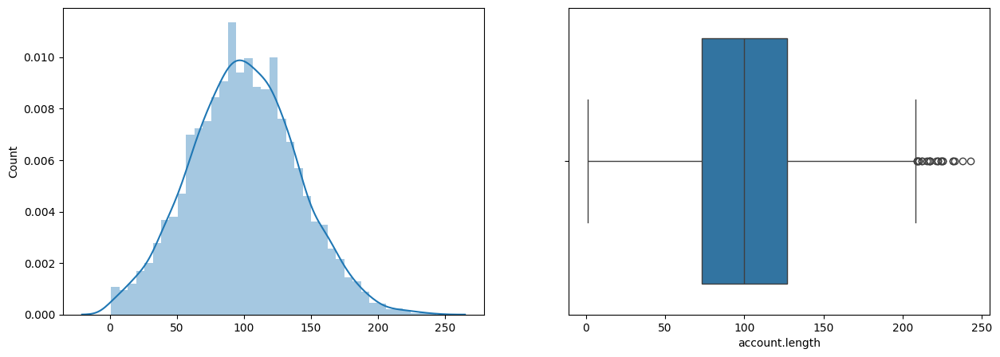

--------------

--------------

voice.messages
skew :  1.35


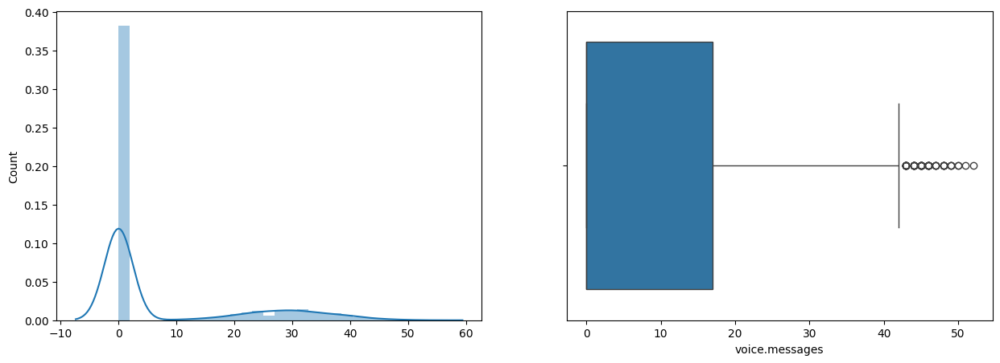

--------------

--------------

intl.mins
skew :  -0.21


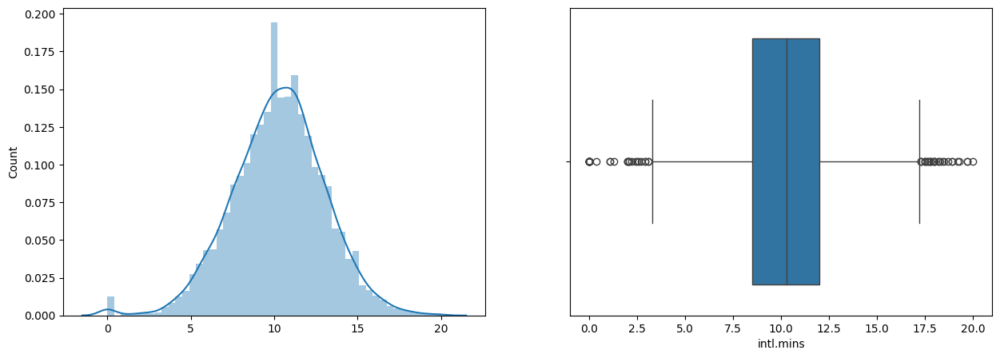

--------------

--------------

intl.calls
skew :  1.36


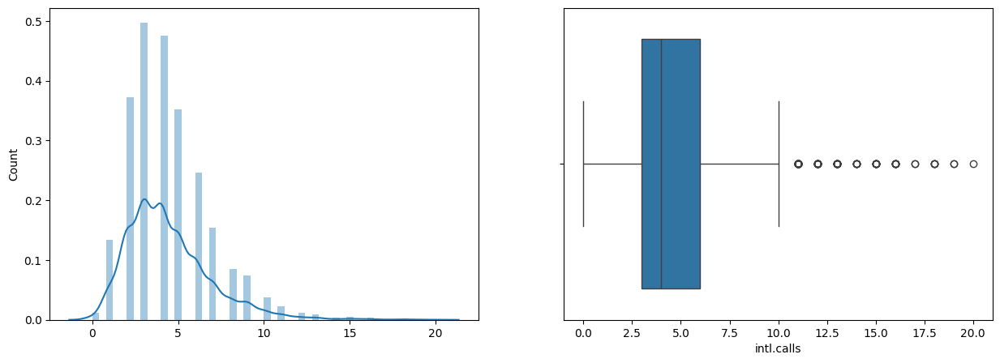

--------------

--------------

intl.charge
skew :  -0.21


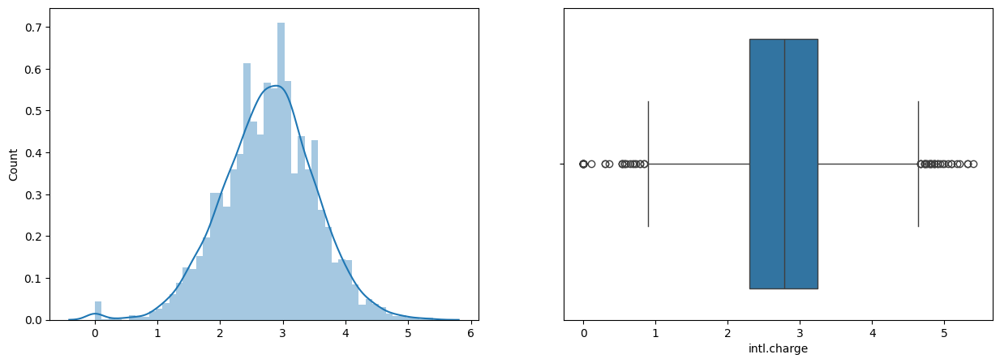

--------------

--------------

day.mins
skew :  -0.01


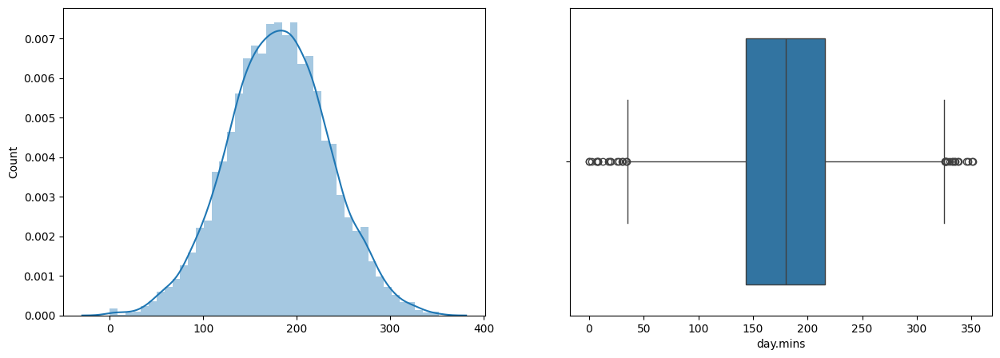

--------------

--------------

day.calls
skew :  -0.09


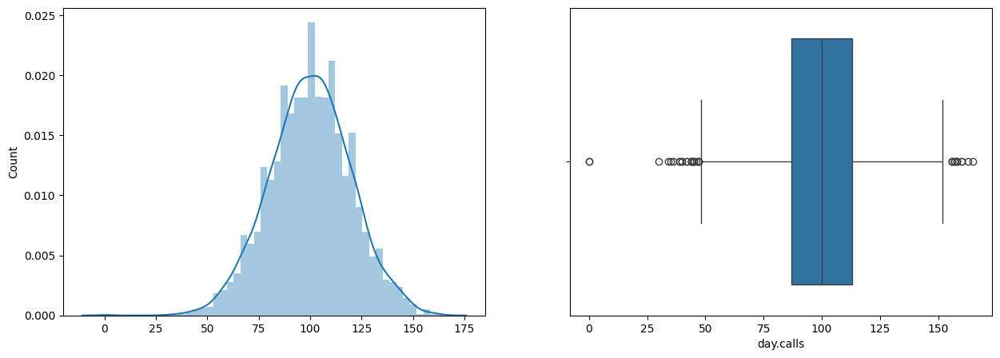

--------------

--------------

day.charge
skew :  -0.01


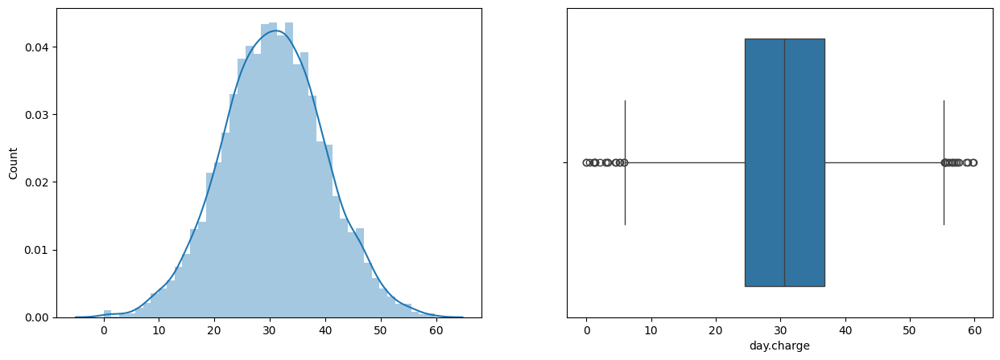

--------------

--------------

eve.mins
skew :  -0.01


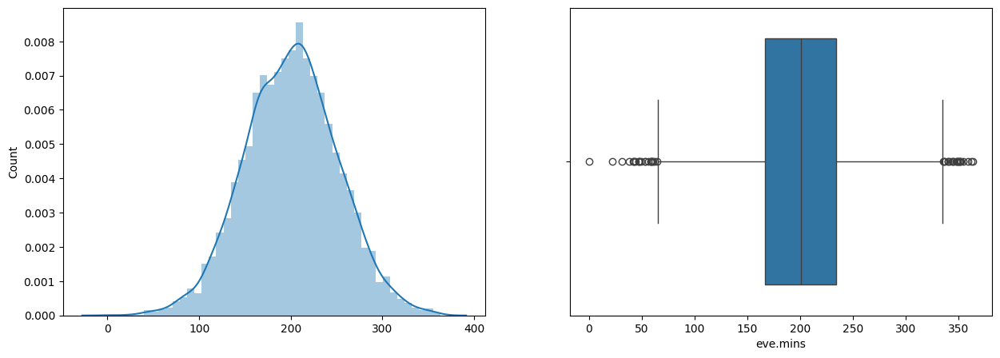

--------------

--------------

eve.calls
skew :  -0.02


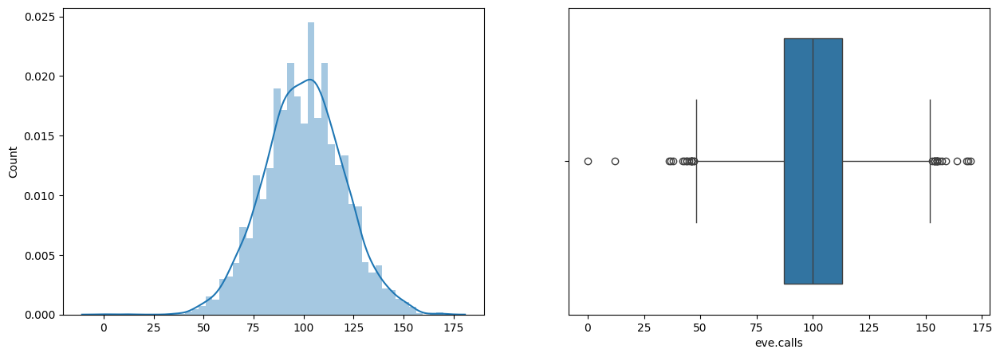

--------------

--------------

eve.charge
skew :  -0.01


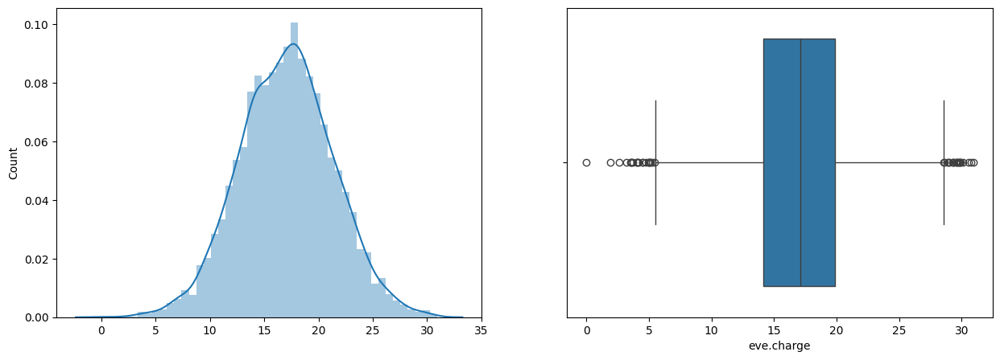

--------------

--------------

night.mins
skew :  0.02


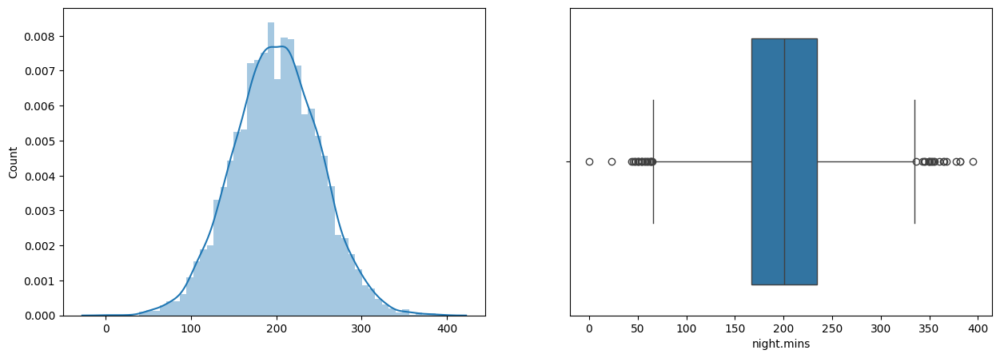

--------------

--------------

night.calls
skew :  0.0


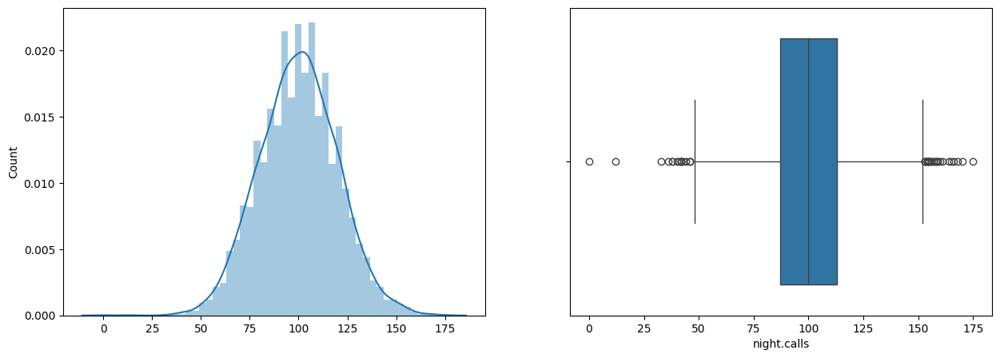

--------------

--------------

night.charge
skew :  0.02


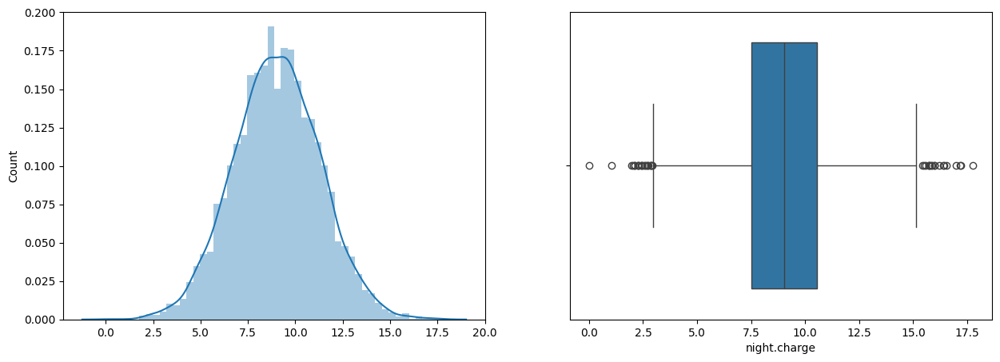

--------------

--------------

customer.calls
skew :  1.04


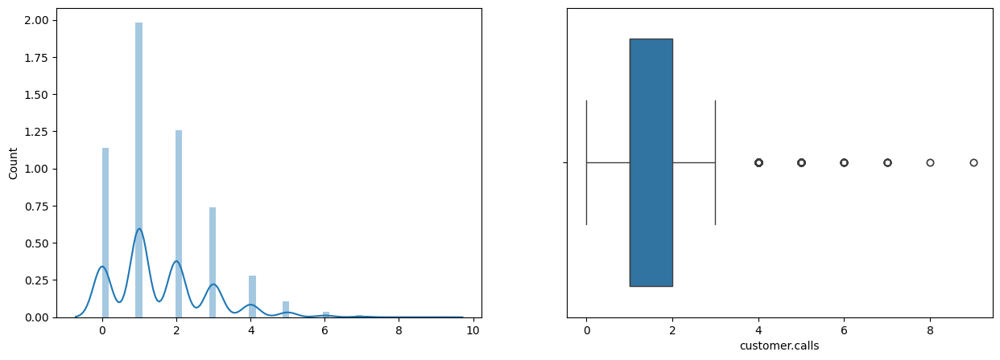

In [58]:
for col in num_cols:
  print("--------------\n")
  print("--------------\n")
  print(col)
  print('skew : ',round(df[col].skew(),2))
  plt.figure(figsize=(15,5))
  plt.subplot(1,2,1)
  sns.distplot(x=df[col],hist= True)                           # Frequency Distribution
  plt.ylabel("Count")
  plt.subplot(1,2,2)
  sns.boxplot(x=df[col])                              # Five Point Summary
  plt.show()

--------------

--------------

account.length
skew :  0.11


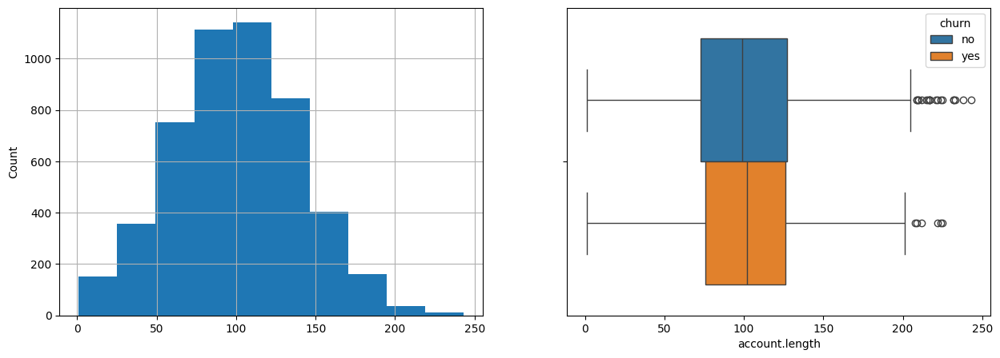

--------------

--------------

voice.messages
skew :  1.35


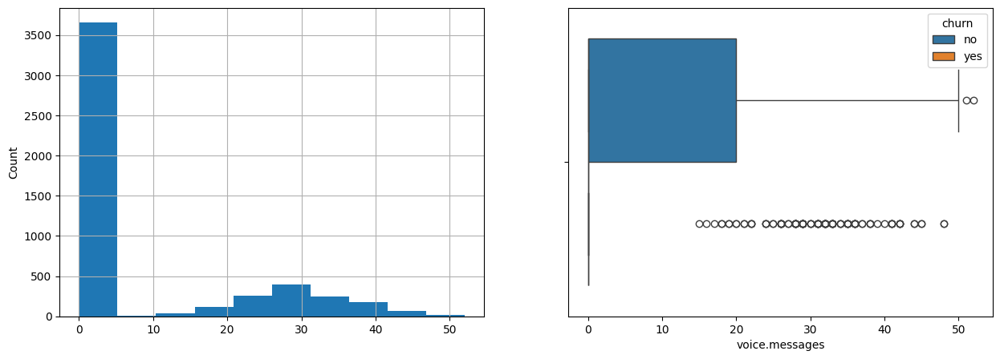

--------------

--------------

intl.mins
skew :  -0.21


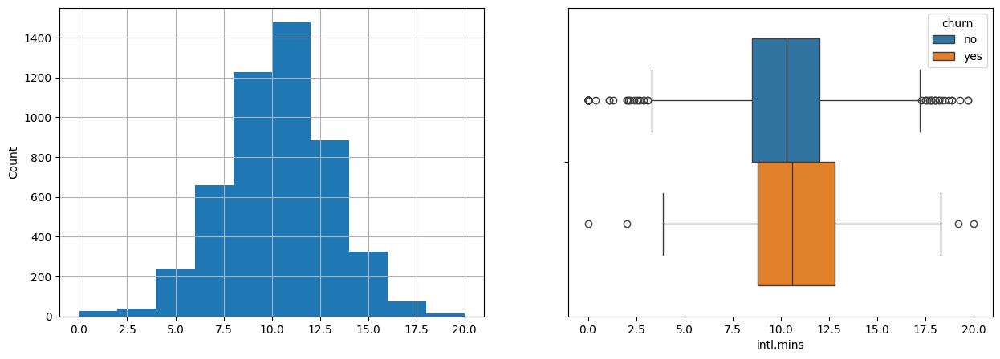

--------------

--------------

intl.calls
skew :  1.36


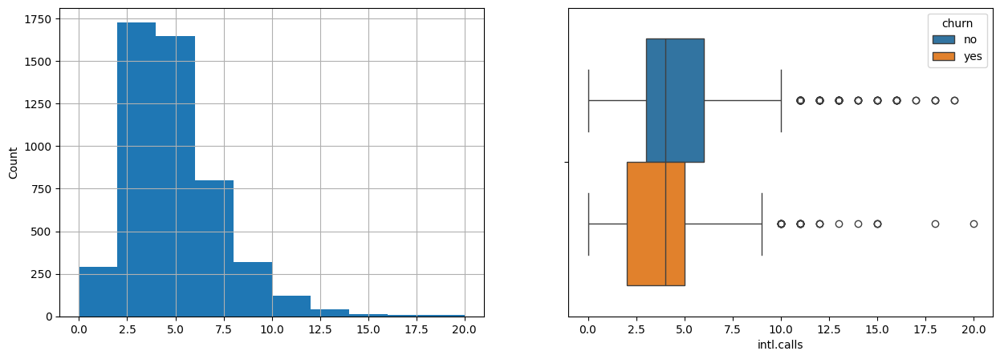

--------------

--------------

intl.charge
skew :  -0.21


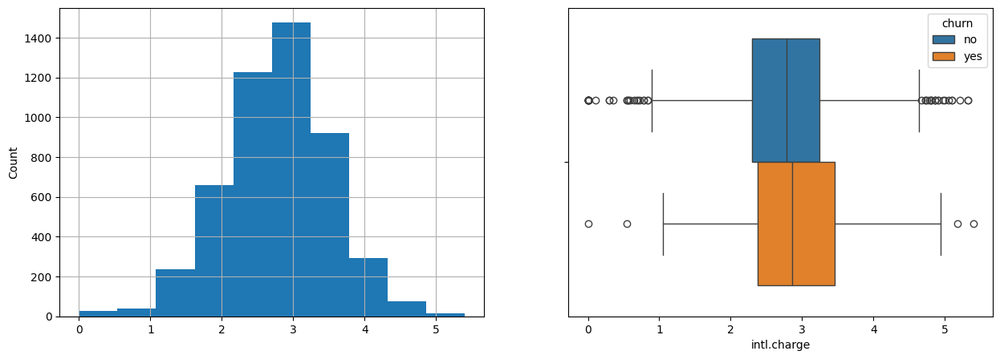

--------------

--------------

day.mins
skew :  -0.01


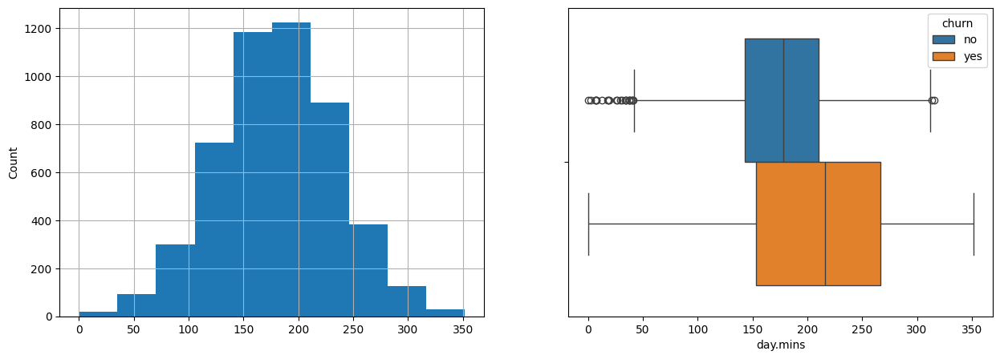

--------------

--------------

day.calls
skew :  -0.09


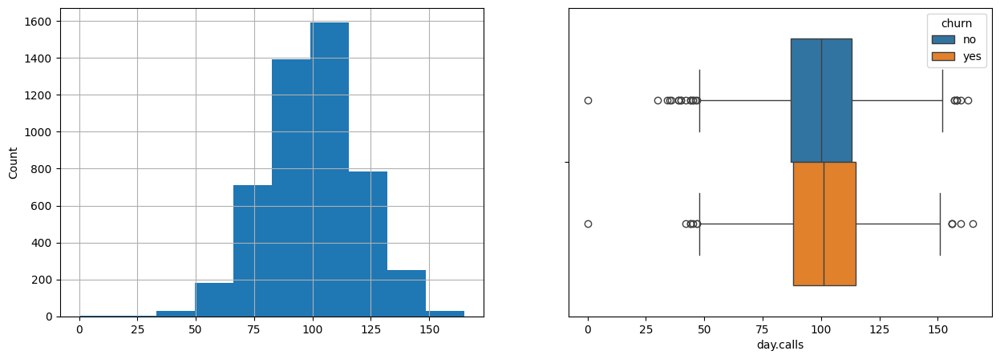

--------------

--------------

day.charge
skew :  -0.01


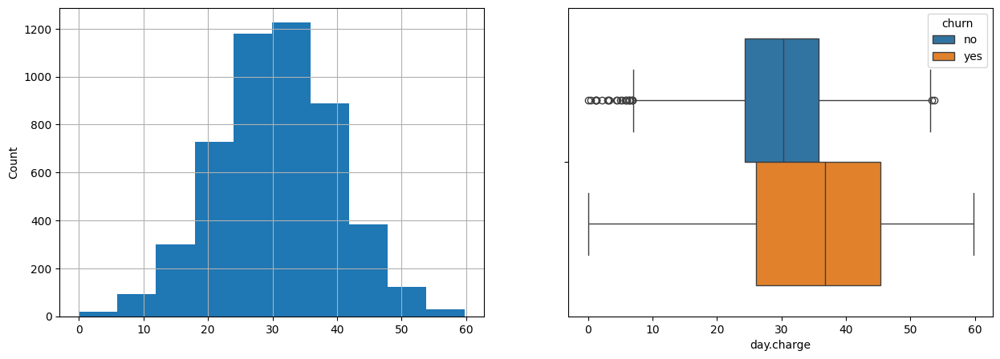

--------------

--------------

eve.mins
skew :  -0.01


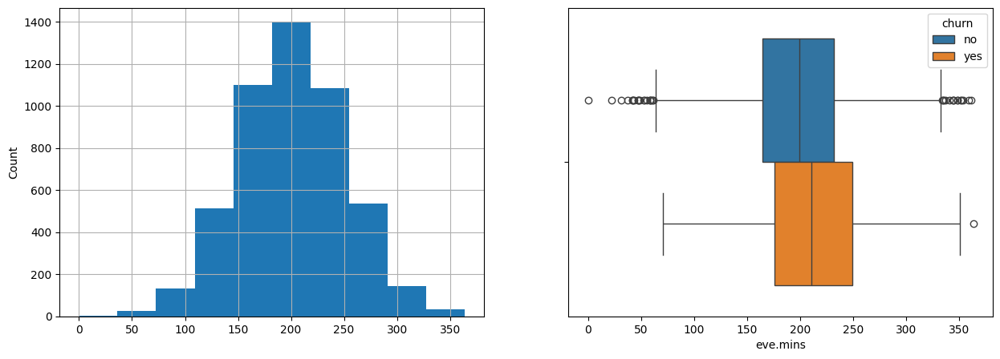

--------------

--------------

eve.calls
skew :  -0.02


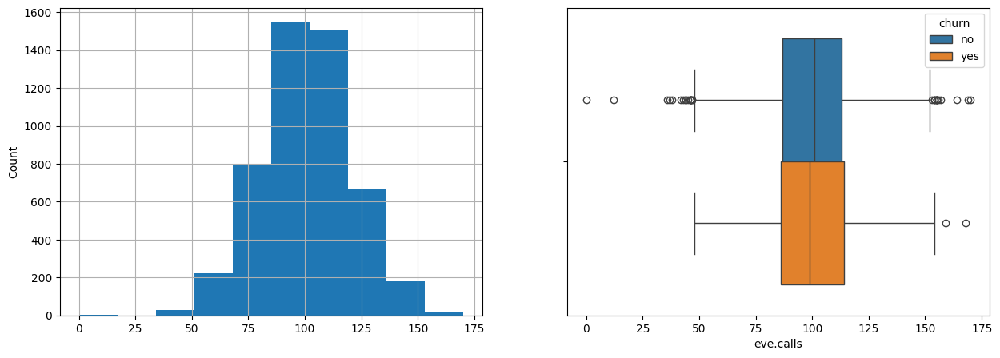

--------------

--------------

eve.charge
skew :  -0.01


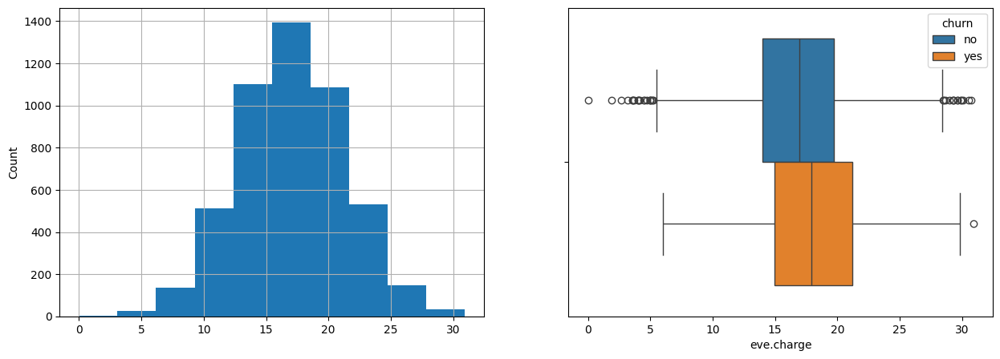

--------------

--------------

night.mins
skew :  0.02


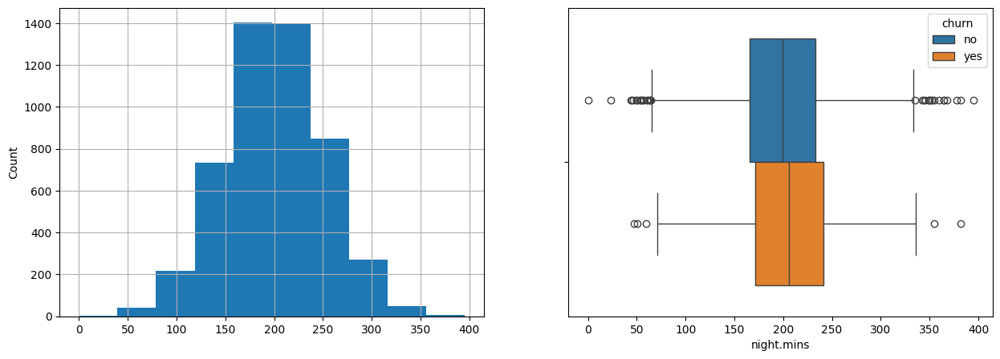

--------------

--------------

night.calls
skew :  0.0


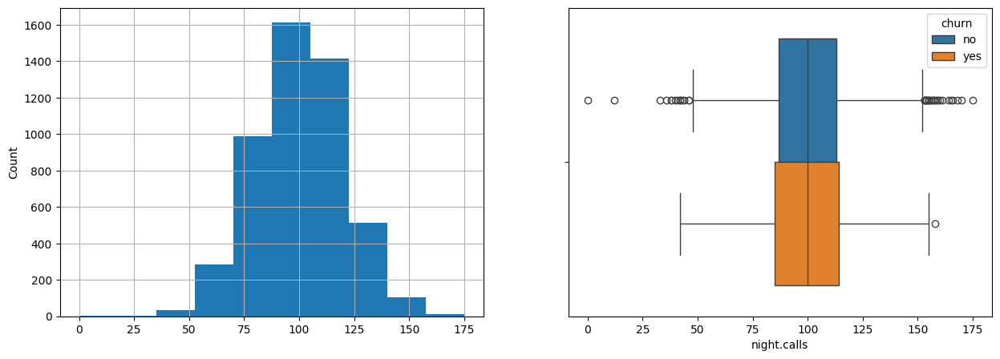

--------------

--------------

night.charge
skew :  0.02


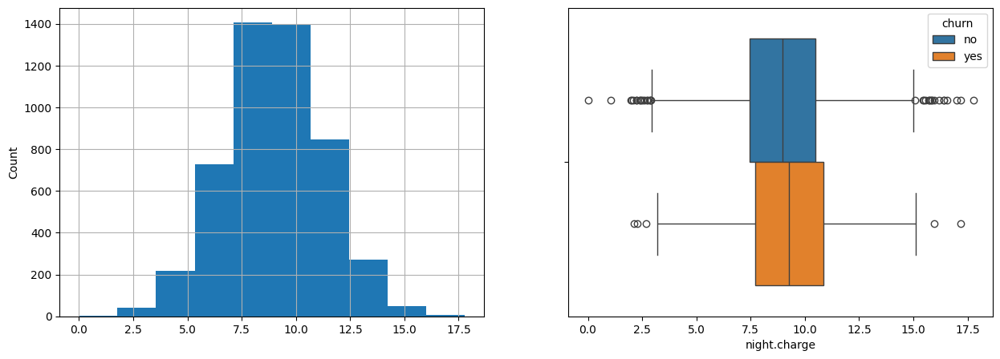

--------------

--------------

customer.calls
skew :  1.04


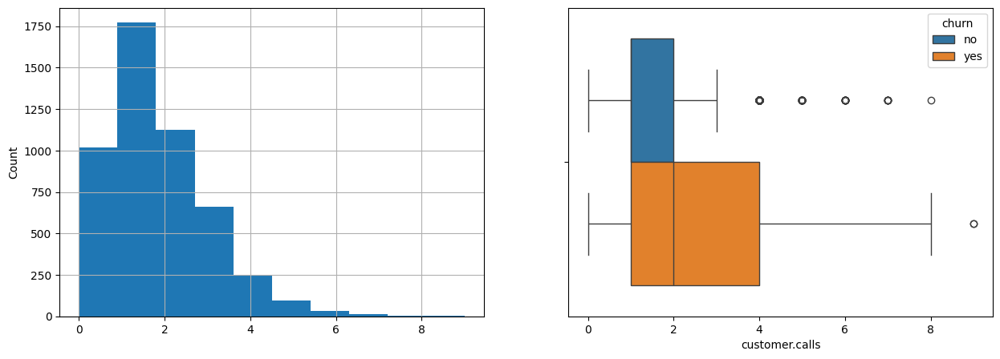

In [59]:
for col in num_cols:
  print("--------------\n")
  print("--------------\n")
  print(col)
  print('skew : ',round(df[col].skew(),2))
  plt.figure(figsize=(15,5))
  plt.subplot(1,2,1)
  df[col].hist(grid = True)                           # Frequency Distribution
  plt.ylabel("Count")
  plt.subplot(1,2,2)
  sns.boxplot(data= df, x= col ,hue = 'churn')                              # Five Point Summary
  plt.show()

* Relation b/w "voice.plan" and "voice messages"
* At  this point , we cannot remove the outliers (availble data size )

In [60]:
len(df[df['voice.plan']=='no'])      # Even though  Intl.plan is not active people are using Intl service unlike voice.plan

3654

In [61]:
cat_cols,len(cat_cols)

(Index(['state', 'area.code', 'voice.plan', 'intl.plan', 'churn'], dtype='object'),
 5)

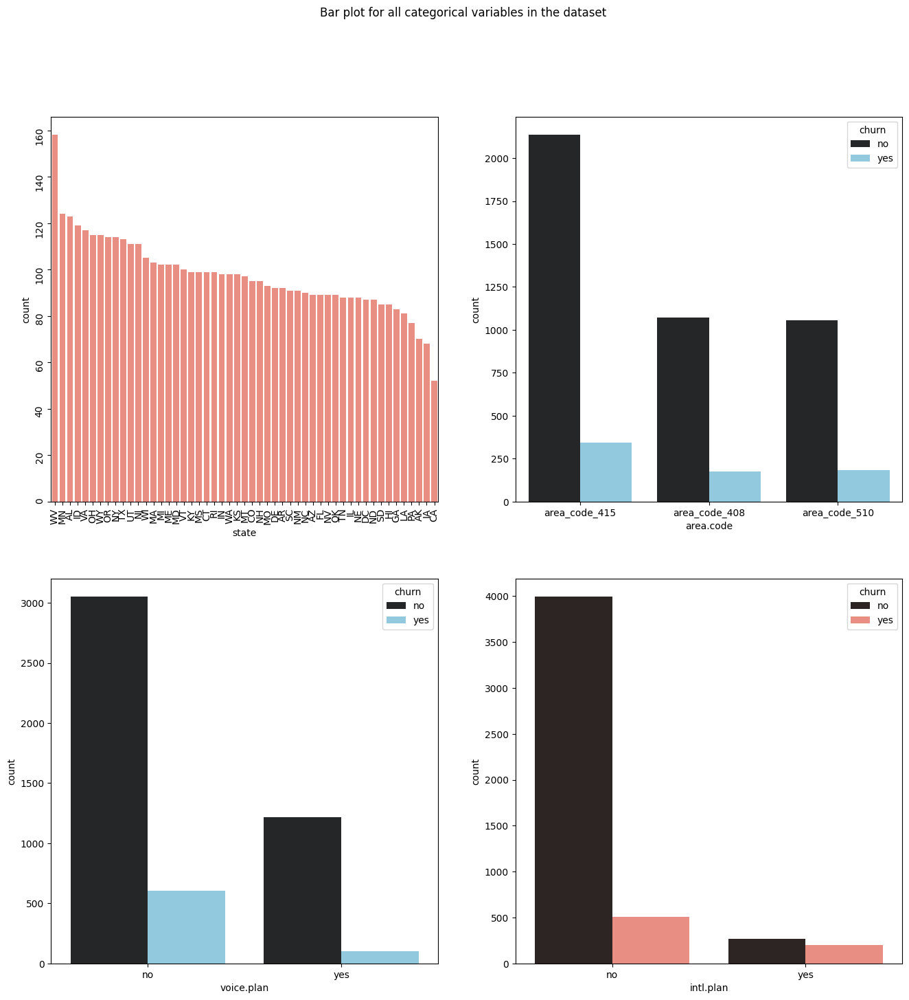

In [62]:
fig, axes = plt.subplots(2, 2, figsize = (16, 16))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'state', data = df, color = 'salmon',
              order = df['state'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'area.code', data = df,hue = 'churn', color = 'skyblue',
              order = df['area.code'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'voice.plan', data = df,hue = 'churn', color = 'skyblue',
              order = df['voice.plan'].value_counts().index);
sns.countplot(ax = axes[1, 1], x = 'intl.plan', data =df,hue = 'churn', color = 'salmon',
              order = df['intl.plan'].value_counts().index);
axes[0][0].tick_params(labelrotation = 90)

* churn (non-loyal) customers are about 14.2 %

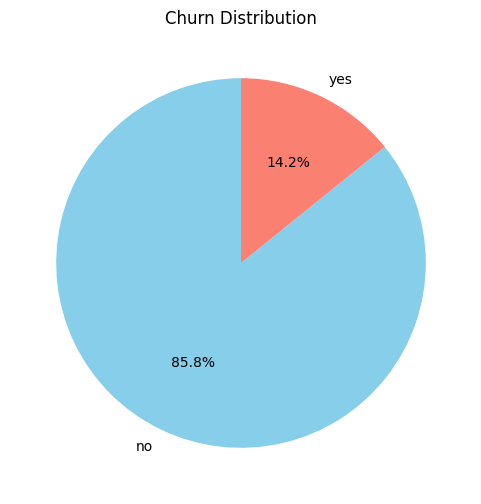

In [63]:
churn_counts = df['churn'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(churn_counts, labels=churn_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'salmon'])
plt.title('Churn Distribution')
plt.show()

* Insights  of data transformations ??? :

In [64]:
# Assuming 'no' means 0 and 'yes' means 1
df["churn"] = df["churn"].map({"no": 0, "yes": 1})

df["churn"] = df["churn"].astype("int64")

In [65]:
# Assuming 'no' means 0 and 'yes' means 1
df["voice.plan"] = df["voice.plan"].map({"no": 0, "yes": 1})

df["voice.plan"] = df["voice.plan"].astype("int64")

In [66]:
# Assuming 'no' means 0 and 'yes' means 1
df["intl.plan"] = df["intl.plan"].map({"no": 0, "yes": 1})

df["intl.plan"] = df["intl.plan"].astype("int64")

In [67]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
account.length,4969.0,100.206681,39.695476,1.0,73.00,100.00,127.00,243.00
voice.plan,4969.0,0.264641,0.441186,0.0,0.00,0.00,1.00,1.00
voice.messages,4969.0,7.754880,13.545738,0.0,0.00,0.00,17.00,52.00
intl.plan,4969.0,0.094586,0.292672,0.0,0.00,0.00,0.00,1.00
intl.mins,4969.0,10.264198,2.761996,0.0,8.50,10.30,12.00,20.00
intl.calls,4969.0,4.433085,2.459495,0.0,3.00,4.00,6.00,20.00
intl.charge,4969.0,2.771851,0.745672,0.0,2.30,2.78,3.24,5.40
day.mins,4969.0,180.306178,53.931206,0.0,143.70,180.10,216.20,351.50
day.calls,4969.0,100.021936,19.835965,0.0,87.00,100.00,113.00,165.00
day.charge,4969.0,30.652604,9.168275,0.0,24.43,30.62,36.75,59.76


#### Bi-variate Analysis

<Figure size 1800x1800 with 0 Axes>

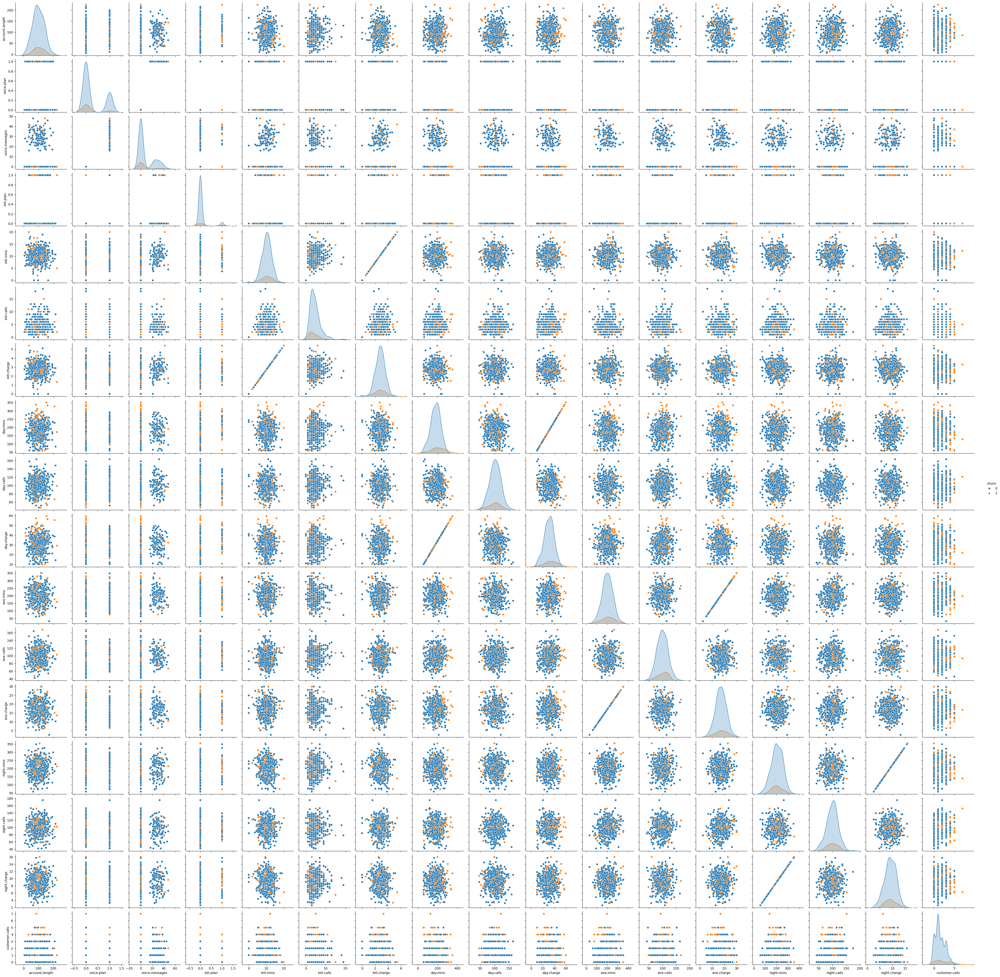

In [36]:
plt.figure(figsize =(18,18))
sns.pairplot(df.head(500),hue = 'churn')          #slow
plt.show()

#### bar plot for categorical columns vs numerical columns

In [68]:
#bar plots ...Incoming

#### Multi-variate analysis

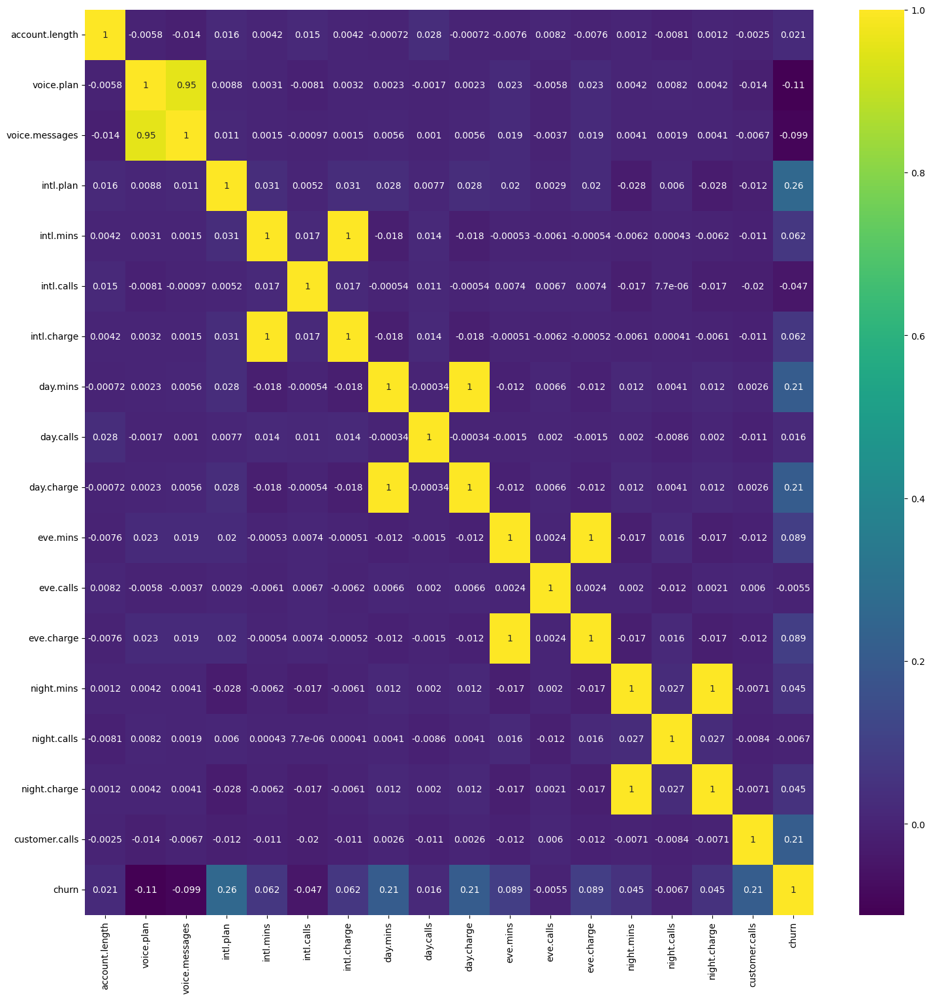

In [69]:
plt.figure(figsize=(18, 18))
sns.heatmap(df.drop(['state','area.code'],axis =1).corr(), annot = True,cmap = 'viridis' )
plt.show()

# * day charge - day.mins , eve.charge -eve.mins , night.charge -night.mins , intl.charge -intl.mins , voice.plan - voice.messages    foo <font color='red'> -- Insights -->Feature Engineering....Incoming
</font> foo

Binning

In [70]:
from random import randint
df_ages = pd.DataFrame({"age" :[randint(20,55) for x in range(8)]})
df_ages["age_bins"] = pd.cut(x=df_ages["age"],bins=[20,29,39,49,59])
df_ages["ages_by_decade"]=pd.cut(x=df_ages["age"],bins = [20,29,39,49,59],labels= ['20s','30s','40s','50s'])
df_ages

,age,age_bins,ages_by_decade
0,21,"(20, 29]",20s
1,45,"(39, 49]",40s
2,49,"(39, 49]",40s
3,42,"(39, 49]",40s
4,52,"(49, 59]",50s
5,34,"(29, 39]",30s
6,31,"(29, 39]",30s
7,53,"(49, 59]",50s
